# Step 1: Install Requirements

In [1]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!pip install -qr requirements.txt # install dependencies
!pip install -q dill
!pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16960, done.
remote: Counting objects: 100% (155/155), done.
remote: Compressing objects: 100% (110/110), done.
remote: Total 16960 (delta 79), reused 95 (delta 45), pack-reused 16805 (from 1)
Receiving objects: 100% (16960/16960), 15.71 MiB | 10.99 MiB/s, done.
Resolving deltas: 100% (11612/11612), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 873.6/873.6 kB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.7 MB/s eta 0:00:00
Setup complete. Using torch 2.4.1+cu121 (Tesla T4)


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, you can choose between two paths:

* Convert an existing dataset to YOLOv5 format. Roboflow supports over [30 formats object detection formats](https://roboflow.com/formats) for conversion.
* Upload raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

# Annotate

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/roboflow-annotate.gif)

# Version

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/robolfow-preprocessing.png)


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="YpGGFuImZbb6ezPCNInS")
project = rf.workspace("my-workspace-pkvix").project("oil-spill-detection-ptrxw")
version = project.version(3)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/Oil-Spill-Detection-3 in yolov5pytorch:: 100%|██████████| 692/692 [00:00<00:00, 2190.89it/s]


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 416 --batch 40 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5l6.pt --cache

2024-09-18 12:09:41.352149: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-18 12:09:41.371914: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-18 12:09:41.377855: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l6.pt, cfg=, data=/content/datasets/Oil-Spill-Detection-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=40, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, m

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Oil-Spill-Detection-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-366-gf7322921 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 346 layers, 76118664 parameters, 0 gradients, 109.9 GFLOPs
WARNING ⚠️ --img-size [416, 416] must be multiple of max stride 64, updating to [448, 448]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/10 /content/datasets/Oil-Spill-Detection-3/test/images/video-online-video-cutter-com-_out0022_jpg.rf.09bfbb919a3817f629564d209d8c9613.jpg: 4

In [4]:
!python detect.py --weights best.pt --source vid1.mp4

detect: weights=['best.pt'], source=vid1.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-368-gb163ff8d Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 346 layers, 76118664 parameters, 0 gradients, 109.9 GFLOPs
video 1/1 (1/3396) /content/yolov5/vid1.mp4: 384x640 (no detections), 45.0ms
video 1/1 (2/3396) /content/yolov5/vid1.mp4: 384x640 (no detections), 35.1ms
video 1/1 (3/3396) /content/yolov5/vid1.mp4: 384x640 (no detections), 35.0ms
video 1/1 (4/3396) /content/yolov5/vid1.mp4: 384x640 (no detections), 35.0ms
video 1/1 (5/3396) /content/yolov5/vid

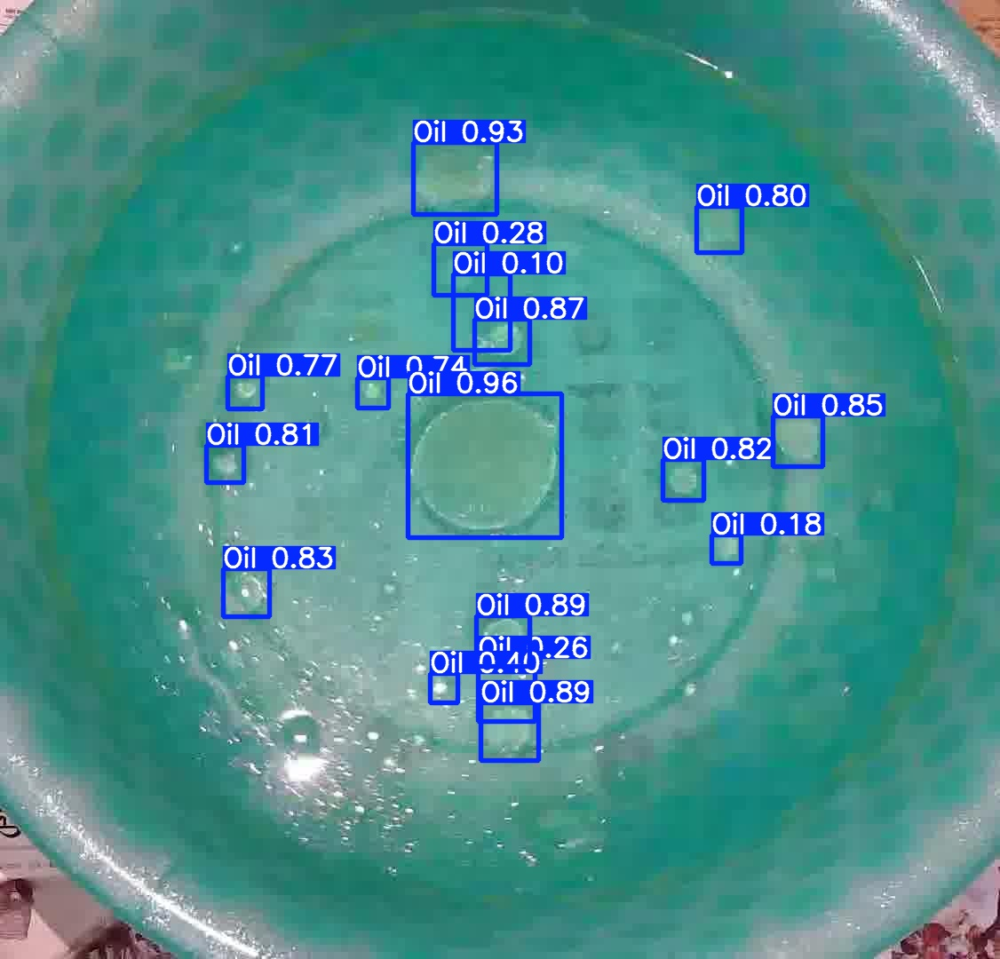

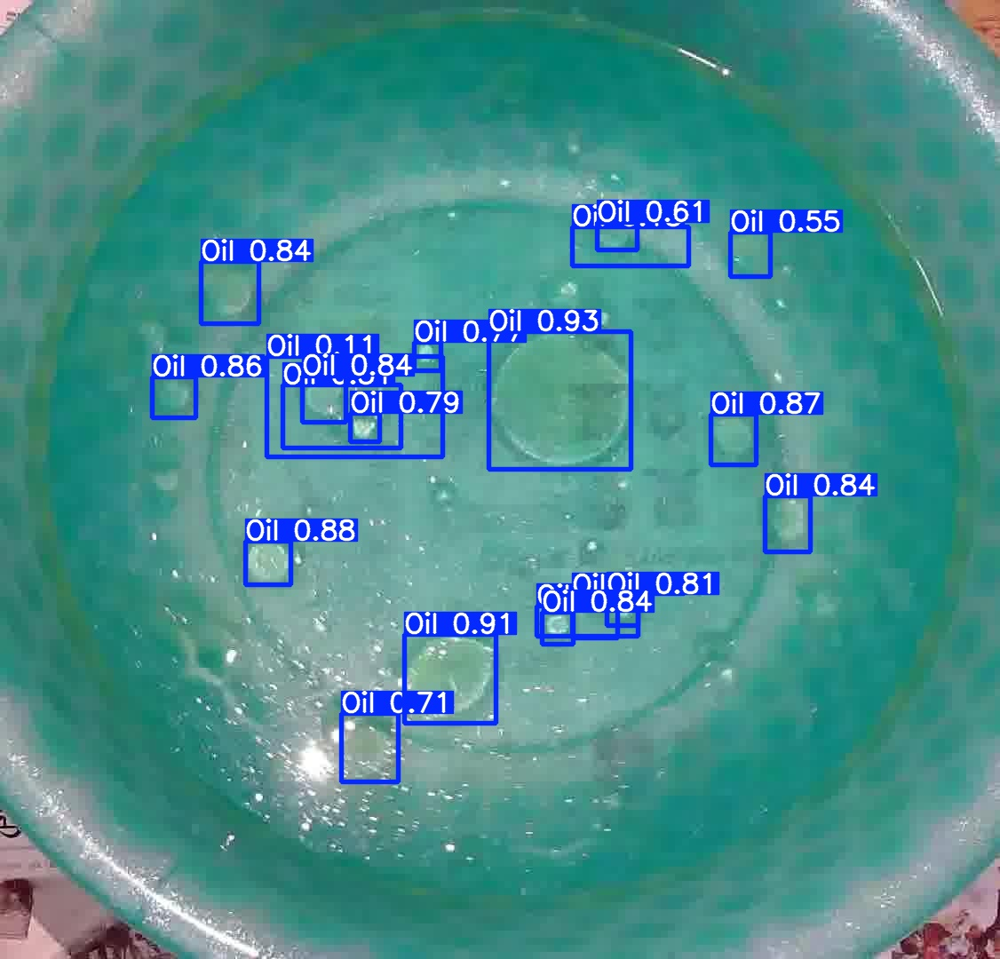

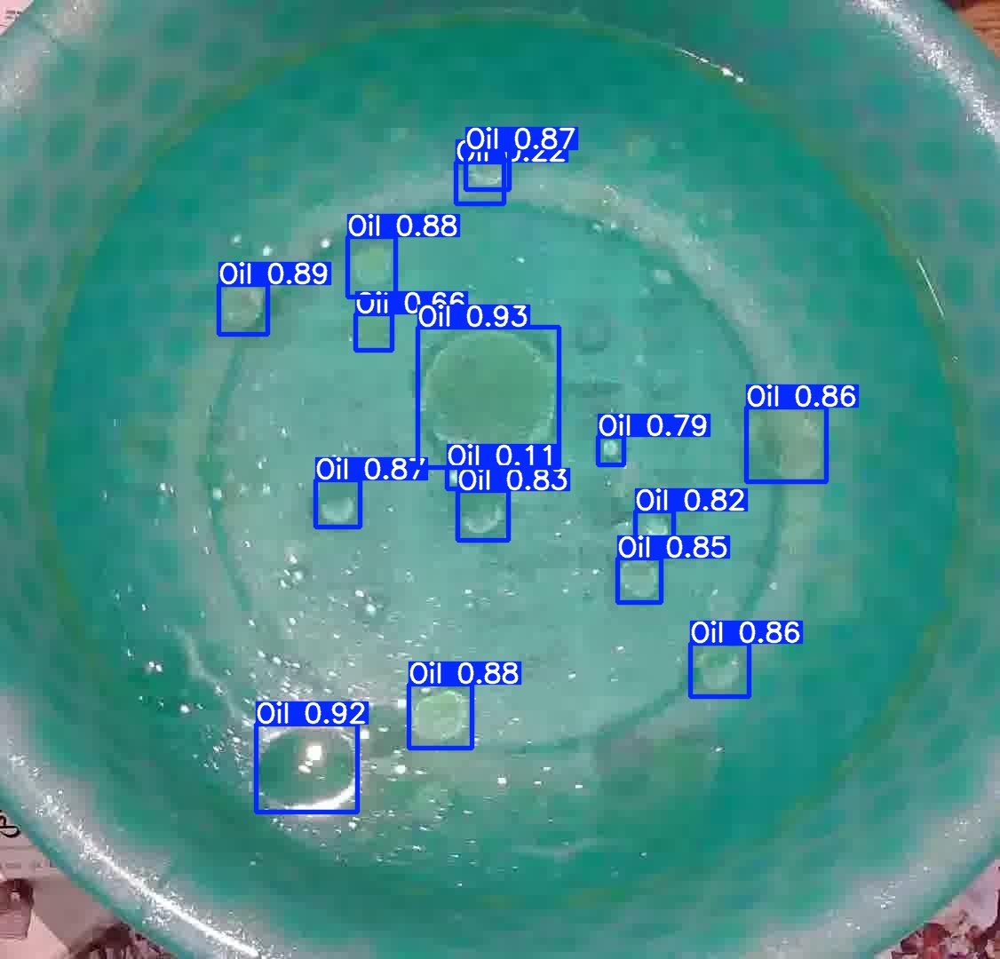

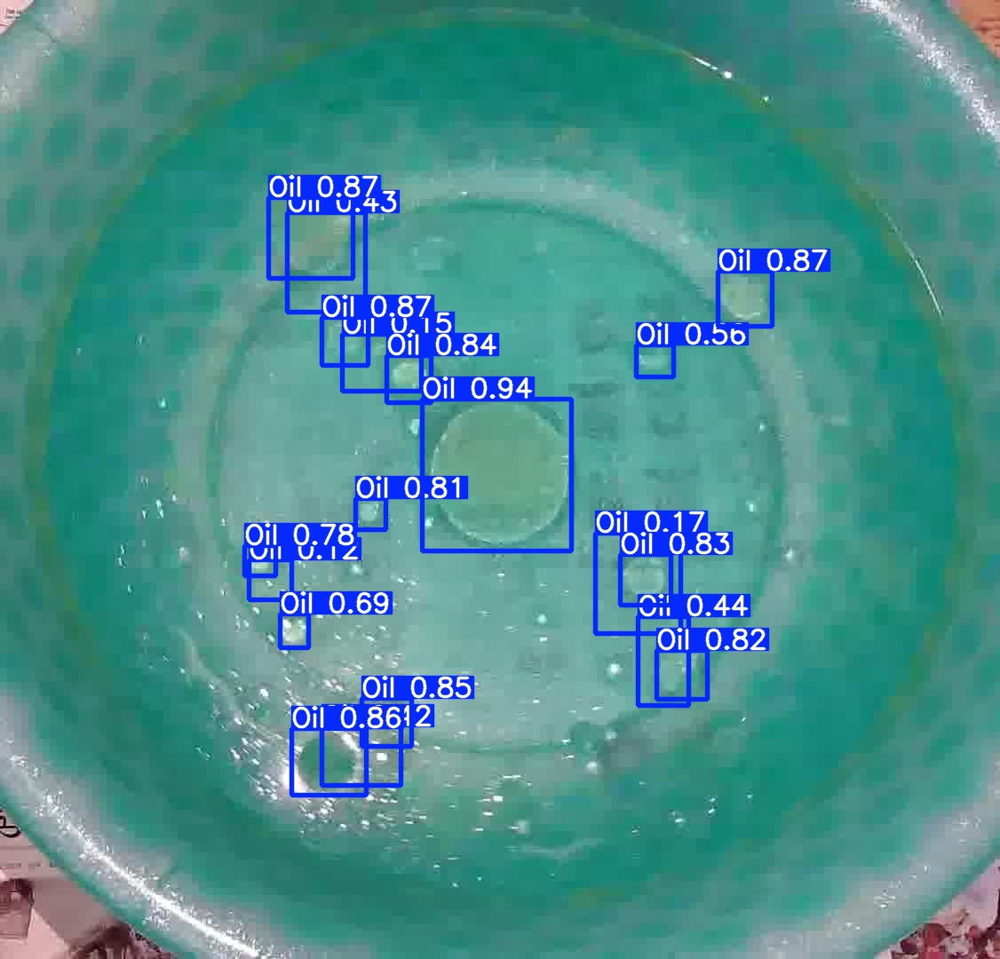

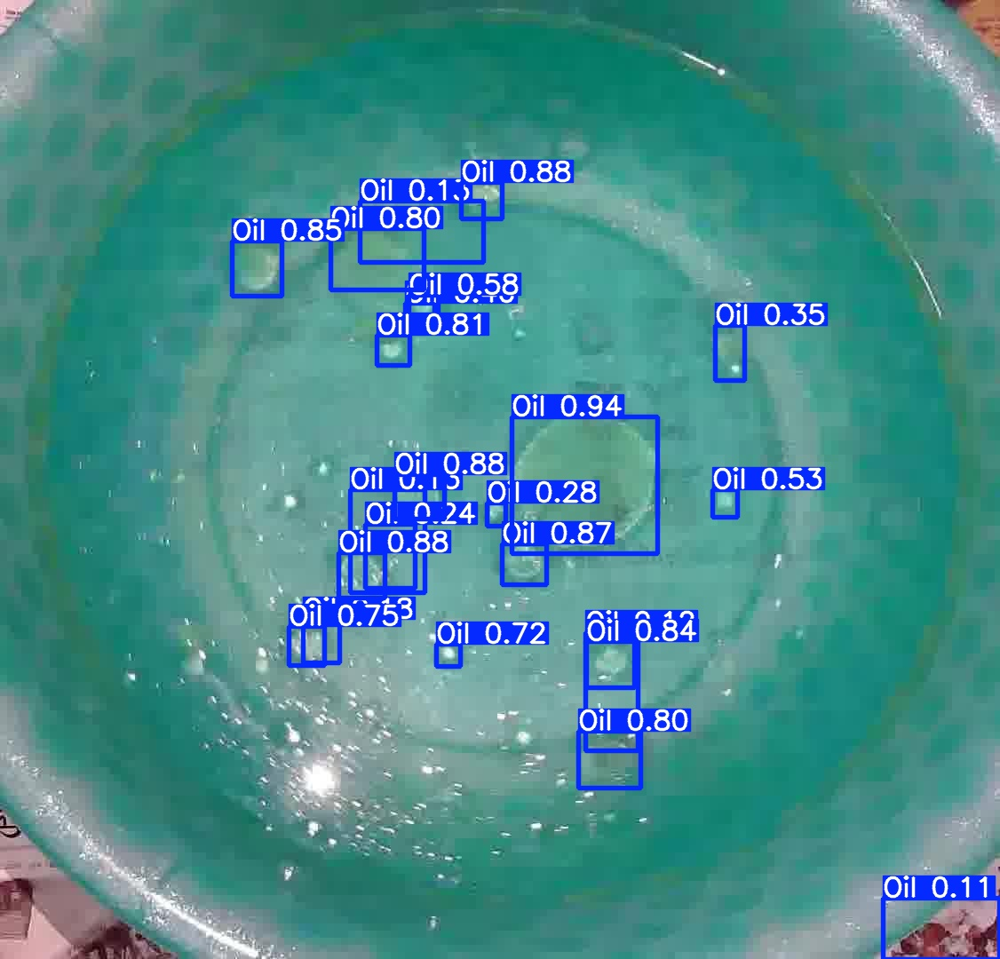

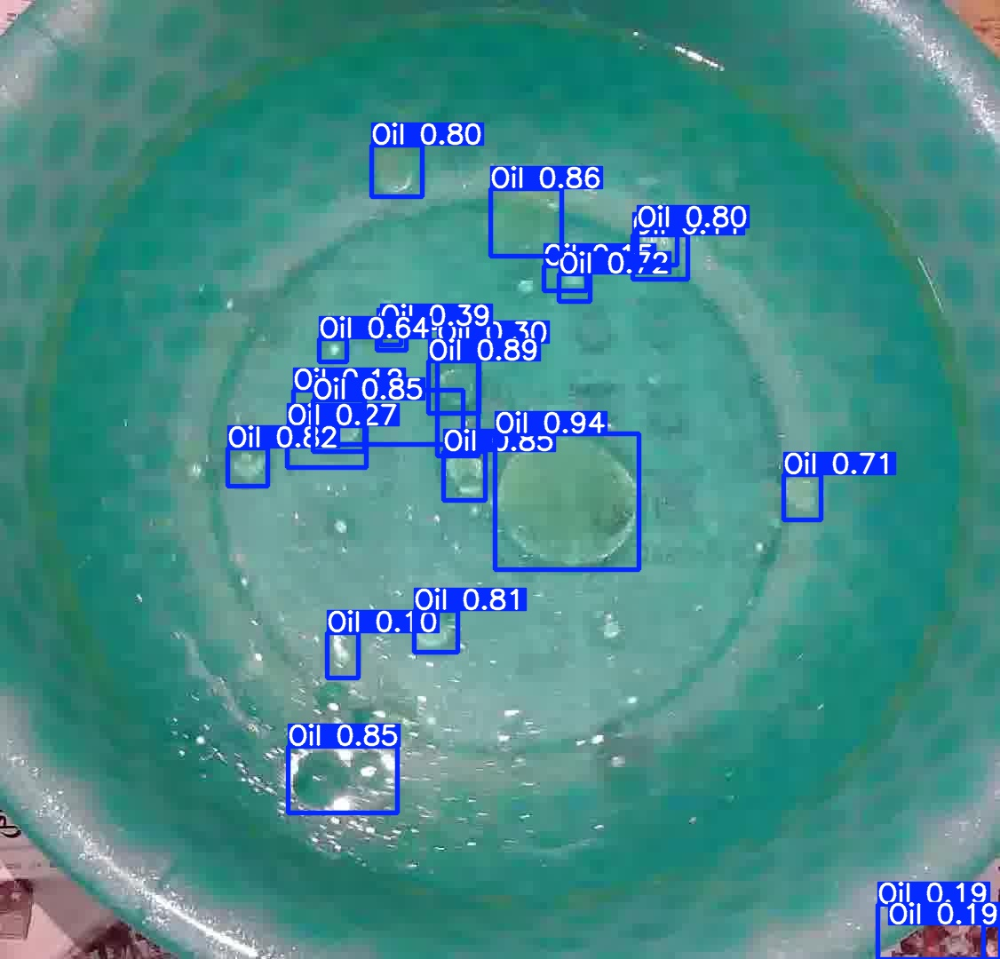

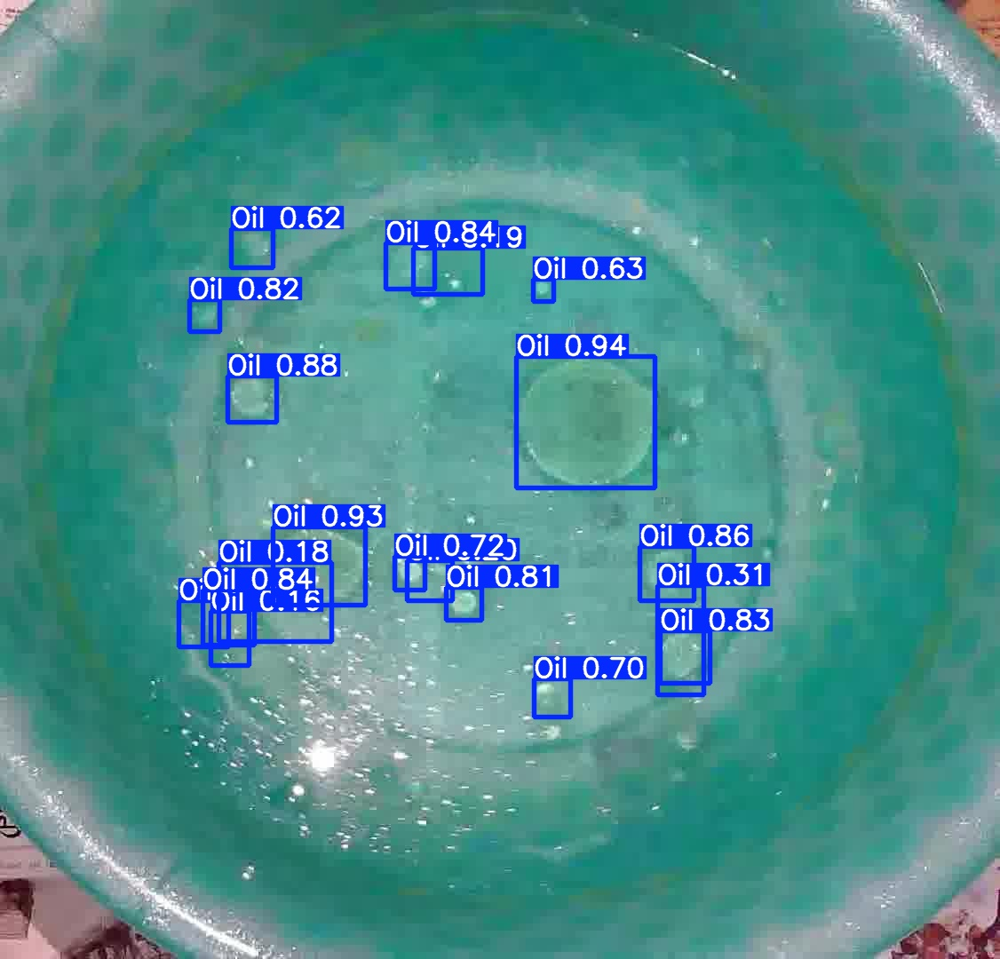

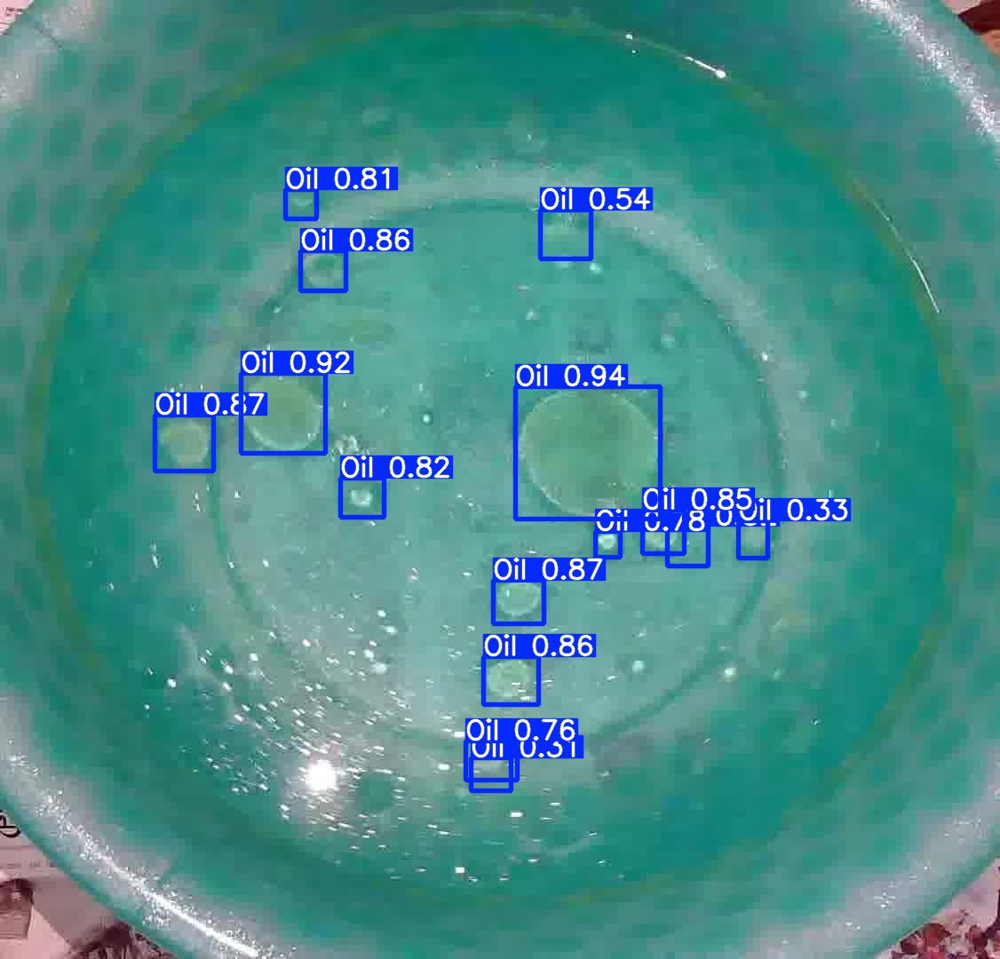

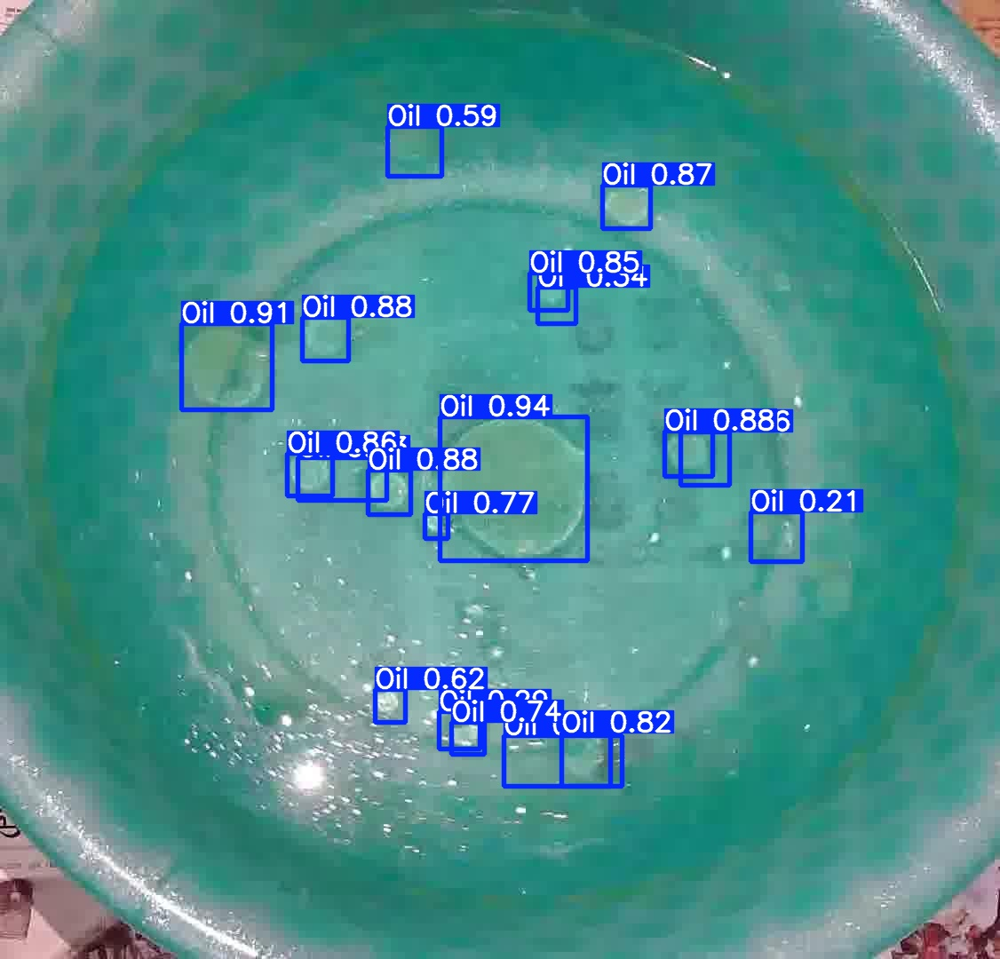

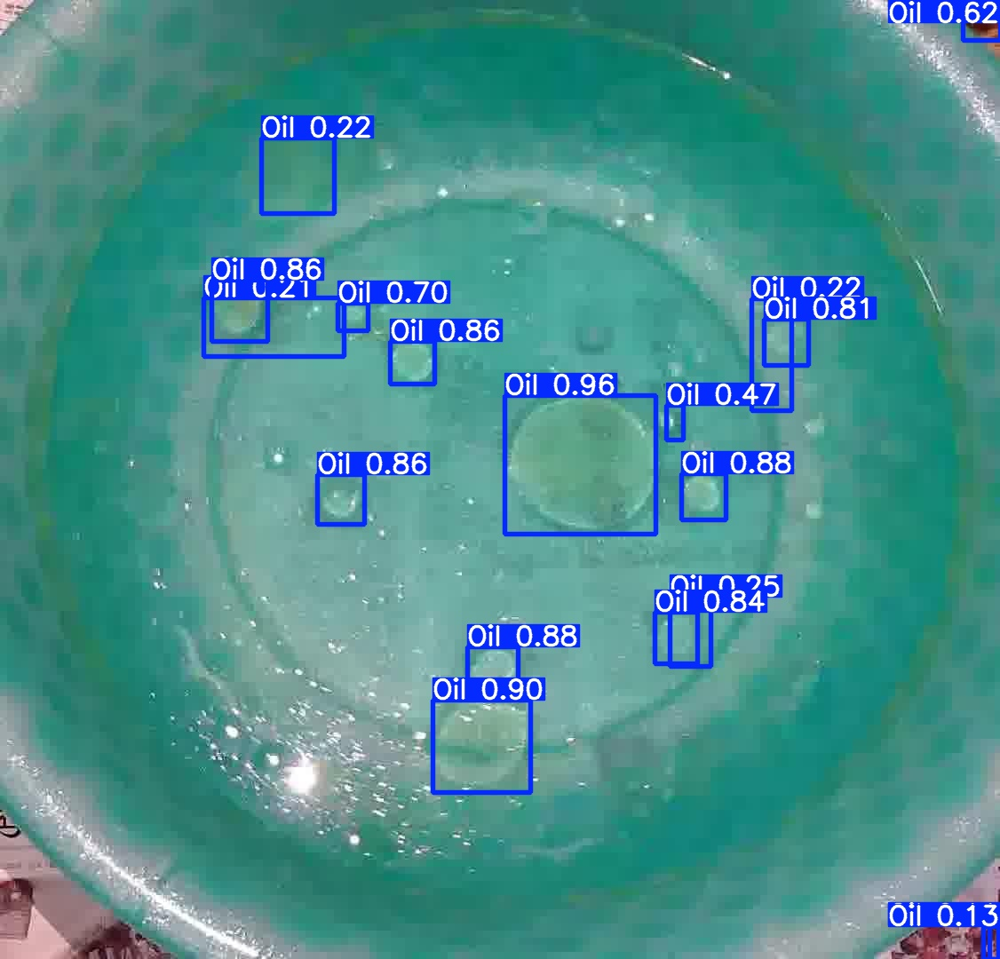

In [ ]:
# Display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
!zip -r /content/exp.zip /content/yolov5/runs/detect/exp

  adding: content/yolov5/runs/detect/exp/ (stored 0%)
  adding: content/yolov5/runs/detect/exp/video-online-video-cutter-com-_out0032_jpg.rf.4201c90cf813543f1c741a05fe0fe5bf.jpg (deflated 7%)
  adding: content/yolov5/runs/detect/exp/video-online-video-cutter-com-_out0026_jpg.rf.a5c53f878787ddbf6eab63a1fe8beb8f.jpg (deflated 5%)
  adding: content/yolov5/runs/detect/exp/video-online-video-cutter-com-_out0029_jpg.rf.af9bc2b3fe6e8036f168a90ce175d217.jpg (deflated 6%)
  adding: content/yolov5/runs/detect/exp/video-online-video-cutter-com-_out0033_jpg.rf.22e71e1b553a3f29b1d3c25d644907cb.jpg (deflated 5%)
  adding: content/yolov5/runs/detect/exp/video-online-video-cutter-com-_out0023_jpg.rf.cd020aa460c505a84aa172110879e656.jpg (deflated 5%)
  adding: content/yolov5/runs/detect/exp/video-online-video-cutter-com-_out0022_jpg.rf.09bfbb919a3817f629564d209d8c9613.jpg (deflated 5%)
  adding: content/yolov5/runs/detect/exp/video-online-video-cutter-com-_out0025_jpg.rf.0a48a36a23dc3e7ec9819bf6f23b0b2

In [5]:
# Export your model's weights for future use
from google.colab import files
#files.download('./runs/train/exp/weights/best.pt')
files.download('/content/yolov5/runs/detect/exp2/vid1.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!cd /content/yolov5/runs/detect/exp2/